<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc" style="margin-top: 1em;"><ul class="toc-item"><li><span><a href="#Load-Coco-Animals-Dataset" data-toc-modified-id="Load-Coco-Animals-Dataset-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Load Coco Animals Dataset</a></span></li><li><span><a href="#Load-ImageNet-dataset-for-labels" data-toc-modified-id="Load-ImageNet-dataset-for-labels-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Load ImageNet dataset for labels</a></span></li><li><span><a href="#Predict-coco-animals-images-using-VGG16" data-toc-modified-id="Predict-coco-animals-images-using-VGG16-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Predict coco animals images using VGG16</a></span></li><li><span><a href="#Predict-coco-animals-images-using-retrained-VGG16" data-toc-modified-id="Predict-coco-animals-images-using-retrained-VGG16-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Predict coco animals images using retrained VGG16</a></span></li></ul></div>

# VGG16 in Keras <a class="tocSkip">

In [1]:
import math
import os

import numpy as np
np.random.seed(123)
print("NumPy:{}".format(np.__version__))

import pandas as pd
print("Pandas:{}".format(pd.__version__))

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.pylab import rcParams
rcParams['figure.figsize']=15,10
print("Matplotlib:{}".format(mpl.__version__))

import tensorflow as tf
tf.set_random_seed(123)
print("TensorFlow:{}".format(tf.__version__))

import keras
print("Keras:{}".format(keras.__version__))

from tensorflow.contrib import slim

NumPy:1.13.3
Pandas:0.21.0
Matplotlib:2.1.0
TensorFlow:1.4.0


Using TensorFlow backend.


Keras:2.0.9


In [2]:
DATASETSLIB_HOME = os.path.expanduser('~/dl-ts/datasetslib')
import sys
if not DATASETSLIB_HOME in sys.path:
    sys.path.append(DATASETSLIB_HOME)
%reload_ext autoreload
%autoreload 2
import datasetslib

from datasetslib import util as dsu
datasetslib.datasets_root = os.path.join(os.path.expanduser('~'),'datasets')
models_root = os.path.join(os.path.expanduser('~'),'models')

# VGG16 Model in Keras

In [3]:
# helper function

def disp(images,labels,id2label=None,probs=None,n_top=5,scale=False):
    if scale:
        imgs = np.abs(images + np.array([[[[123.68, 116.78, 103.94]]]]))/255.0
    else:
        imgs = images

    ids={}
    for j in range(len(images)):
        if scale:
            plt.figure(figsize=(5,5))
            plt.imshow(imgs[j])
        else:
            plt.imshow(imgs[j].astype(np.uint8) )
        plt.show()
        if probs is not None:
            ids[j] = [i[0] for i in sorted(enumerate(-probs[j]), key=lambda x:x[1])]
            for k in range(n_top):
                id = ids[j][k]
                print('Probability {0:1.2f}% of [{1:}]'
                      .format(100*probs[j,id],id2label[id]))

### Load Coco Animals Dataset

In [4]:
# Load the dataset
from datasetslib.coco import coco_animals

coco = coco_animals()
x_train_files, y_train, x_val_files, x_val = coco.load_data()
x_test = [x_val_files[25*x] for x in range(8)]

Already exists: /home/armando/datasets/coco-animals/coco-animals.zip


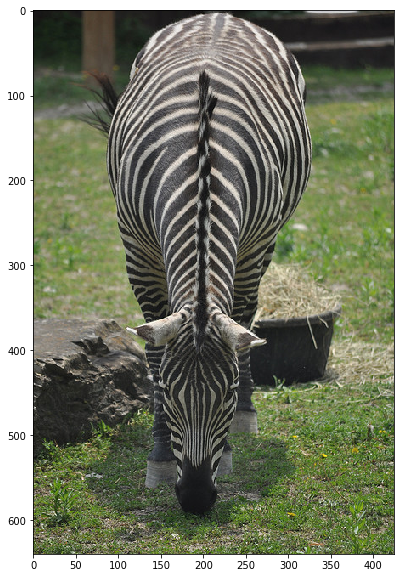

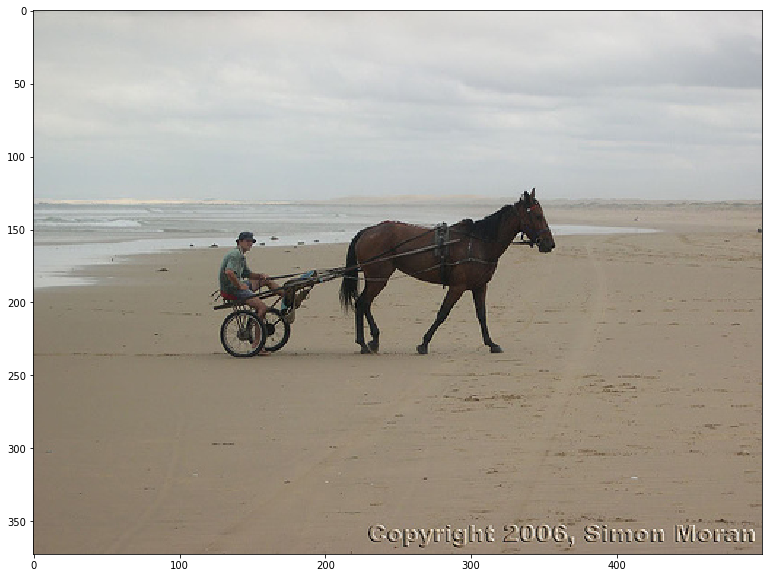

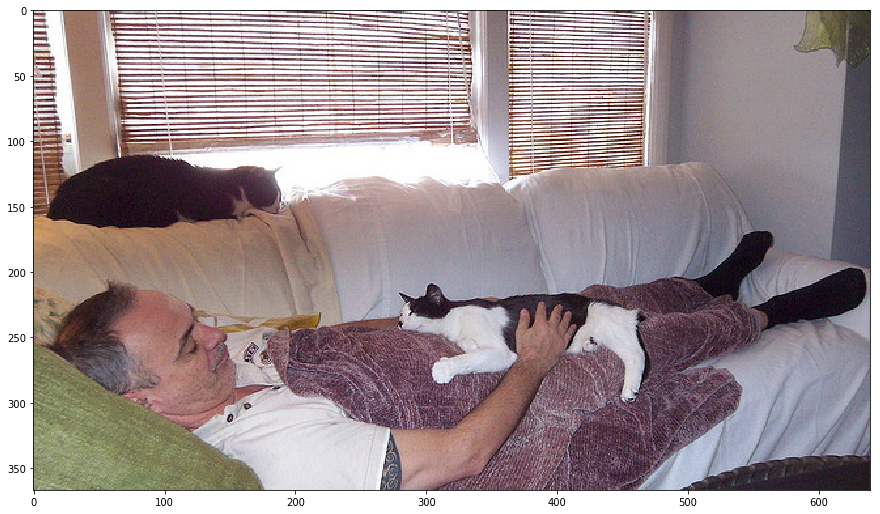

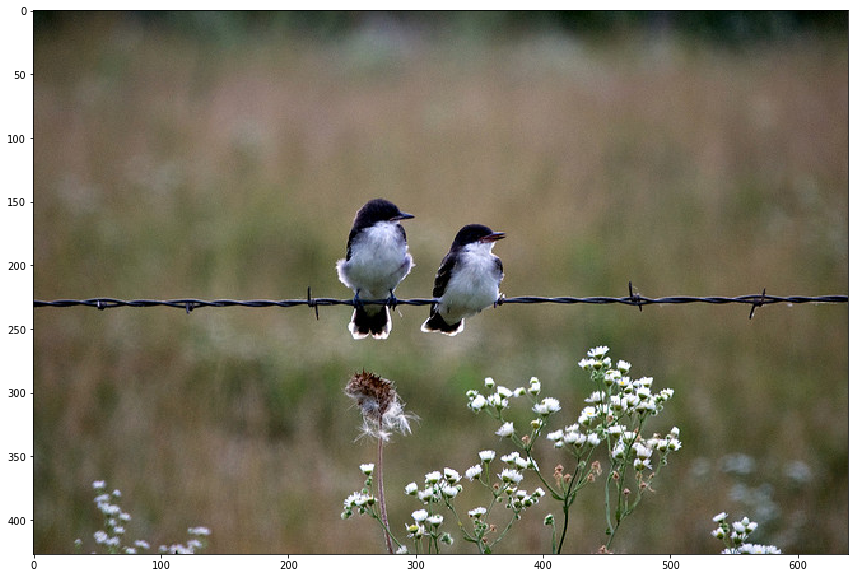

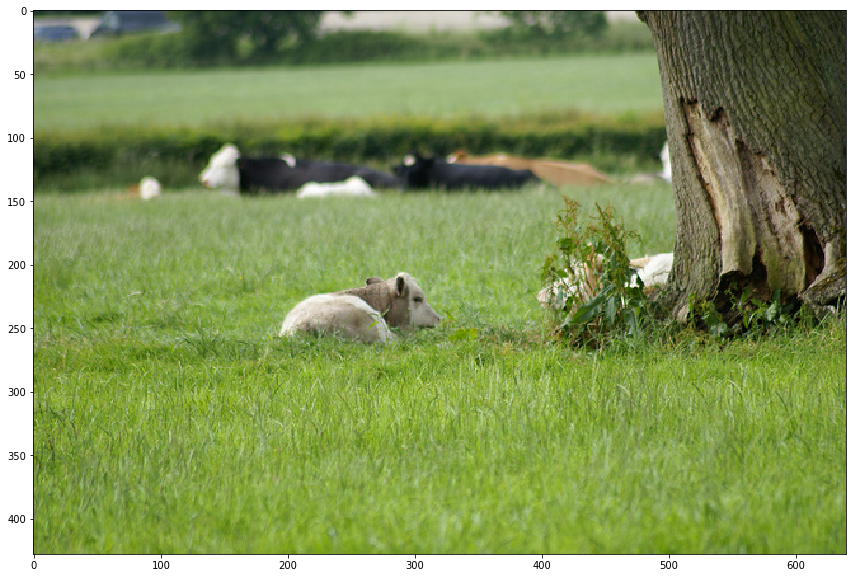

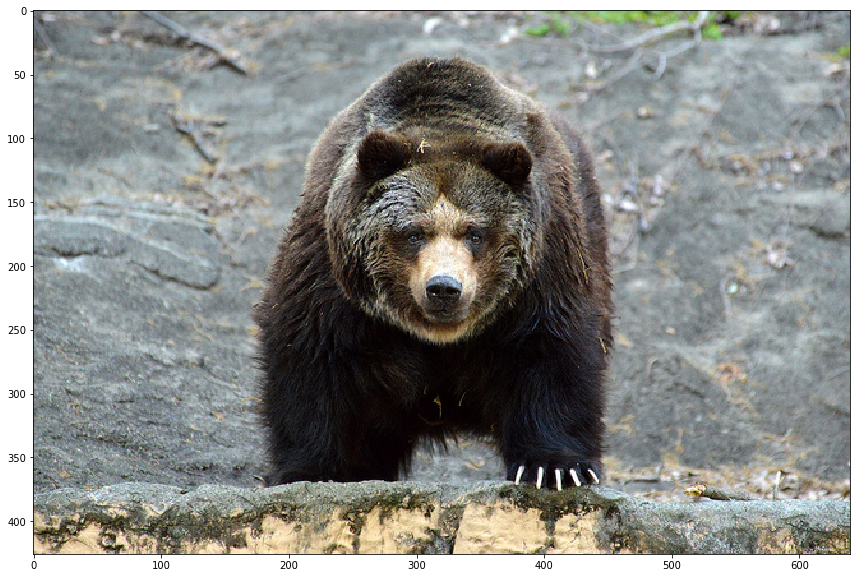

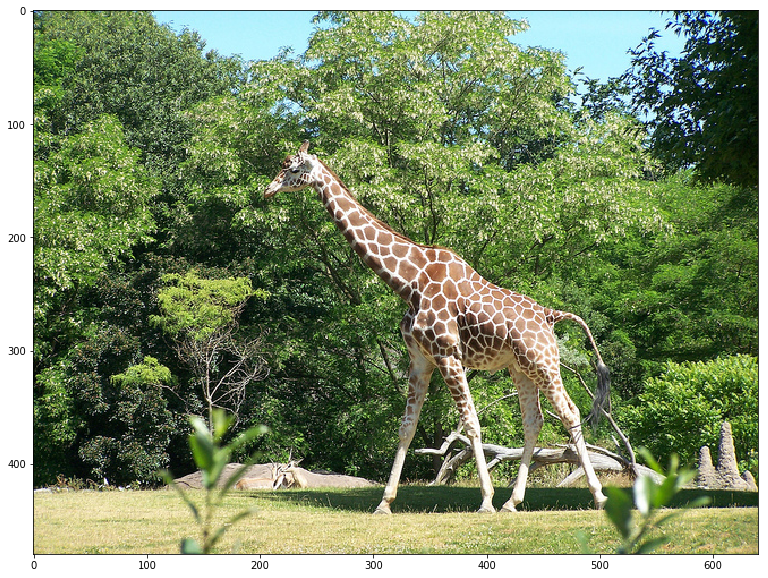

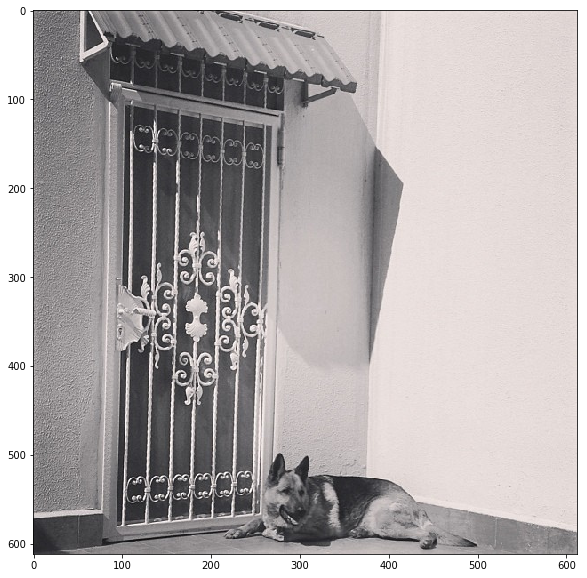

In [5]:
images=np.array([mpimg.imread(x) for x in x_test])

disp(images)

In [6]:
print([x.shape for x in images])

[(640, 425, 3), (373, 500, 3), (367, 640, 3), (427, 640, 3), (428, 640, 3), (426, 640, 3), (480, 640, 3), (612, 612, 3)]


In [7]:
images_test=np.array([coco.preprocess_image(x) for x in x_test])
print(images_test.shape)

(8, 224, 224, 3)


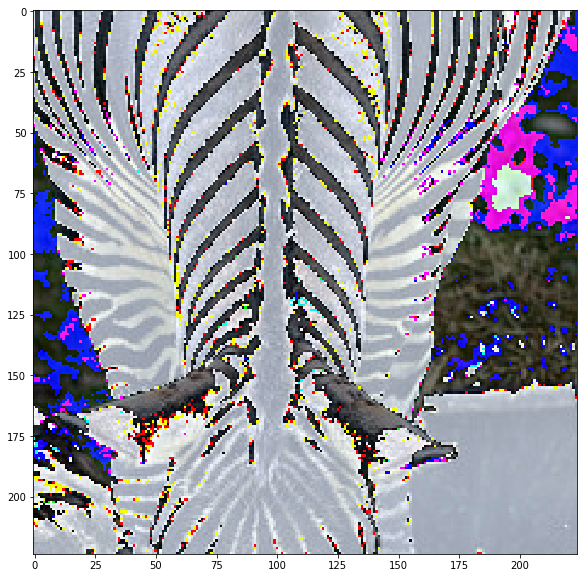

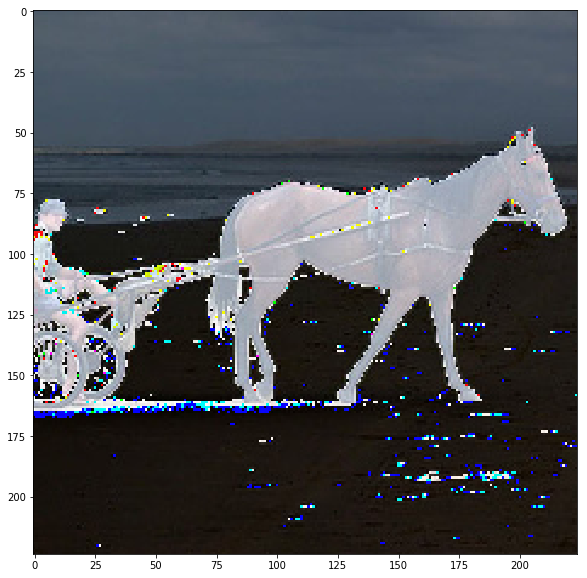

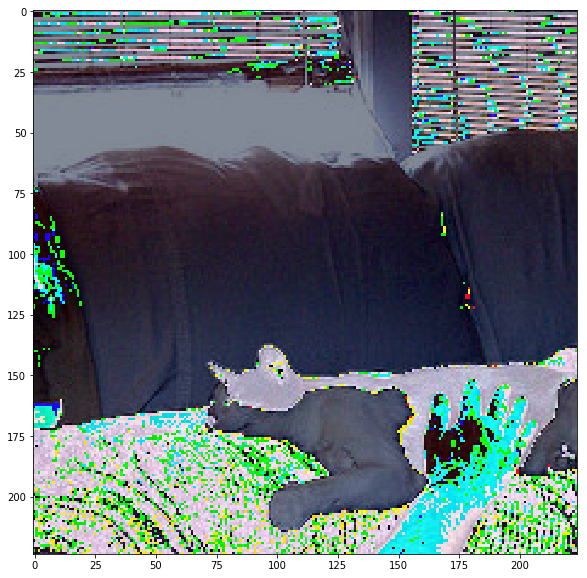

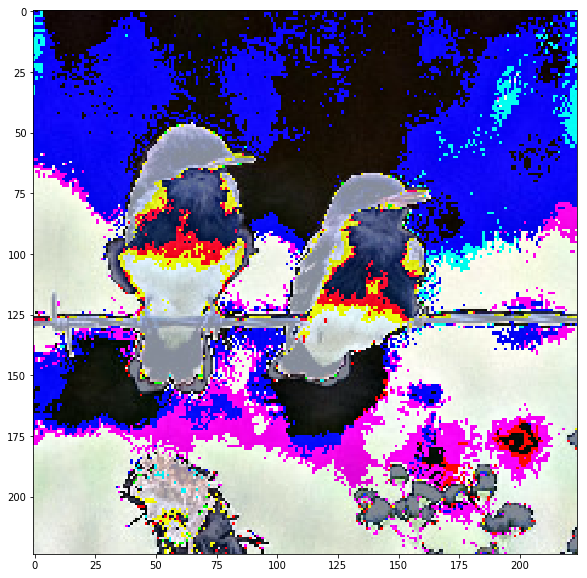

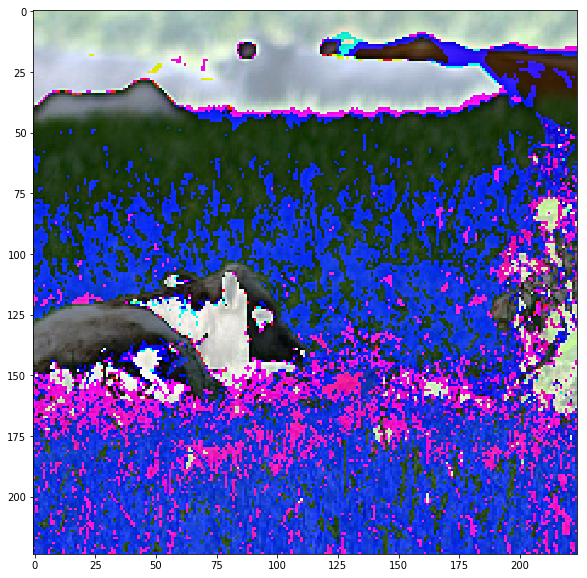

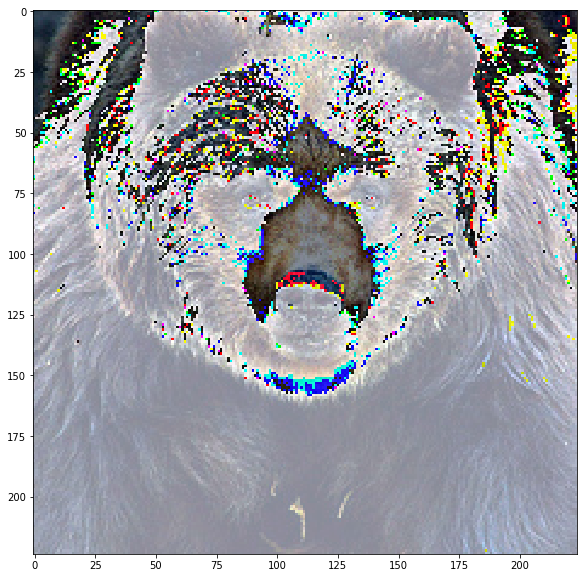

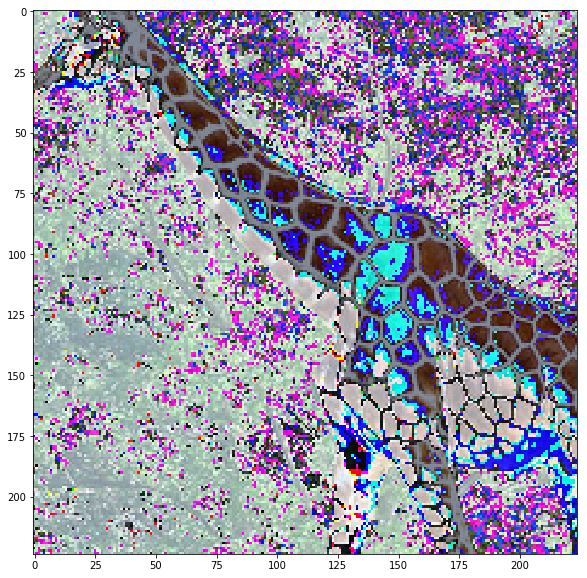

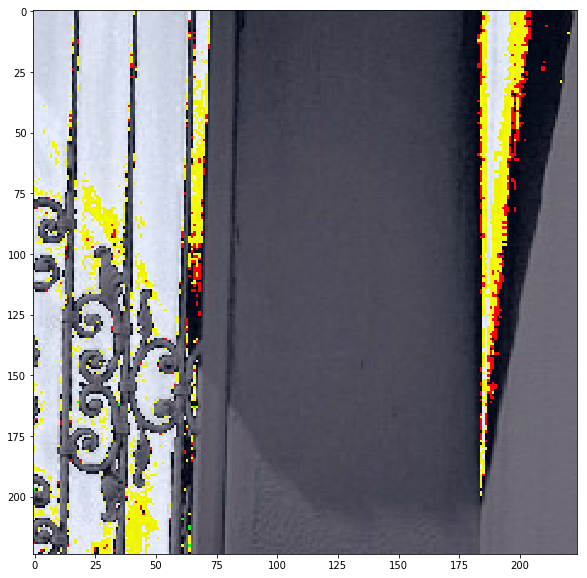

In [8]:
disp(images_test)

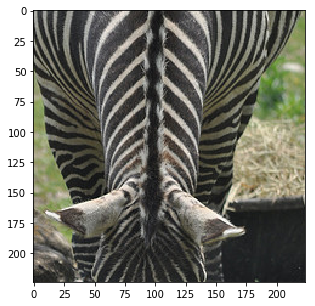

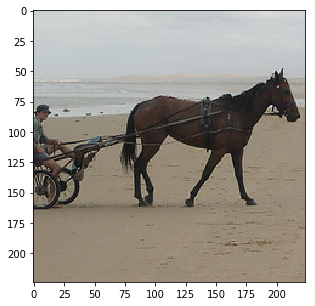

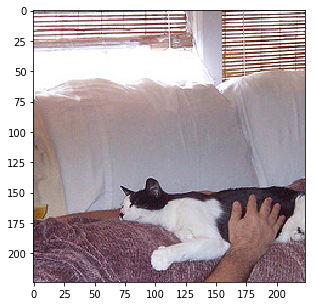

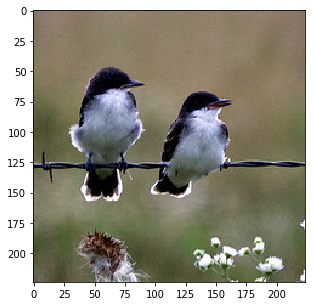

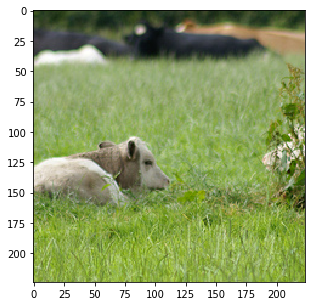

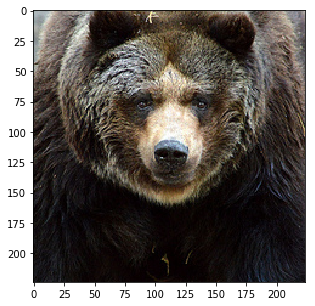

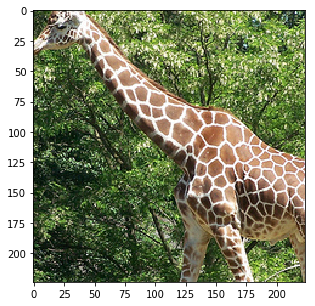

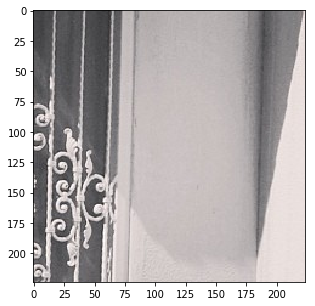

In [9]:
disp(images_test,scale=True)

### Load ImageNet dataset for labels

In [10]:
### Load ImageNet dataset for labels
from datasetslib.imagenet import imageNet
inet = imageNet()
inet.load_data()

### Predict coco animals images using VGG16

In [11]:
tf.reset_default_graph()
keras.backend.clear_session()

# load the vgg model
from keras.applications import VGG16

model=VGG16(weights='imagenet')

probs = model.predict(images_test)
print(probs.shape)

(8, 1000)


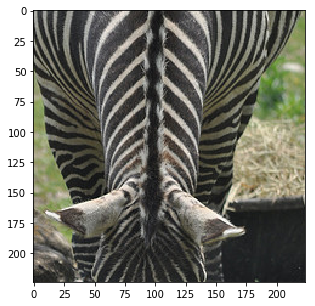

Probability 99.41% of [zebra]
Probability 0.19% of [tiger cat]
Probability 0.13% of [goose]
Probability 0.09% of [tiger, Panthera tigris]
Probability 0.02% of [mushroom]


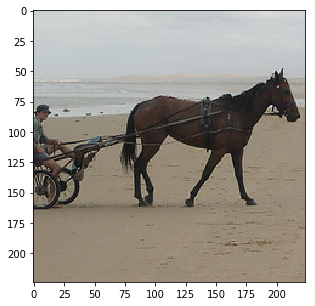

Probability 87.50% of [horse cart, horse-cart]
Probability 5.58% of [Arabian camel, dromedary, Camelus dromedarius]
Probability 4.72% of [plow, plough]
Probability 1.03% of [dogsled, dog sled, dog sleigh]
Probability 0.31% of [wreck]


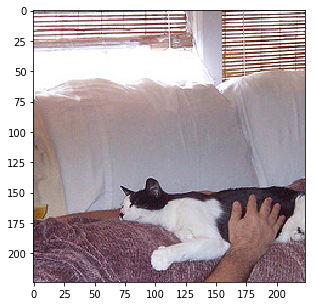

Probability 34.96% of [Siamese cat, Siamese]
Probability 12.71% of [toy terrier]
Probability 10.15% of [Boston bull, Boston terrier]
Probability 6.53% of [Italian greyhound]
Probability 6.01% of [Cardigan, Cardigan Welsh corgi]


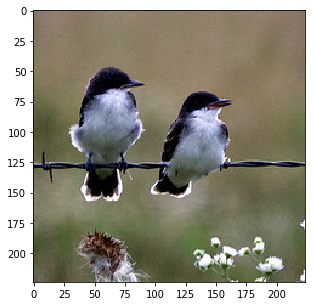

Probability 56.41% of [junco, snowbird]
Probability 38.08% of [chickadee]
Probability 1.93% of [bulbul]
Probability 1.35% of [hummingbird]
Probability 1.09% of [house finch, linnet, Carpodacus mexicanus]


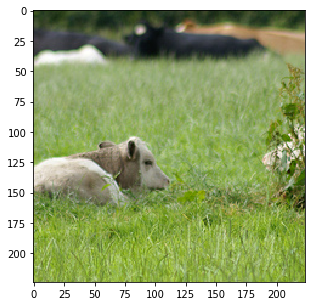

Probability 54.19% of [brown bear, bruin, Ursus arctos]
Probability 28.07% of [lion, king of beasts, Panthera leo]
Probability 0.87% of [Norwich terrier]
Probability 0.82% of [Lakeland terrier]
Probability 0.73% of [wild boar, boar, Sus scrofa]


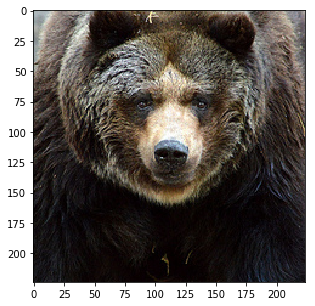

Probability 88.64% of [brown bear, bruin, Ursus arctos]
Probability 7.22% of [American black bear, black bear, Ursus americanus, Euarctos americanus]
Probability 4.13% of [sloth bear, Melursus ursinus, Ursus ursinus]
Probability 0.00% of [badger]
Probability 0.00% of [wombat]


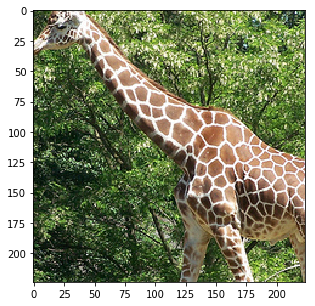

Probability 38.70% of [jaguar, panther, Panthera onca, Felis onca]
Probability 33.78% of [leopard, Panthera pardus]
Probability 14.22% of [cheetah, chetah, Acinonyx jubatus]
Probability 6.15% of [banded gecko]
Probability 1.53% of [snow leopard, ounce, Panthera uncia]


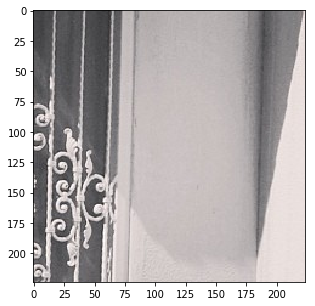

Probability 12.54% of [shower curtain]
Probability 2.82% of [binder, ring-binder]
Probability 2.28% of [toilet tissue, toilet paper, bathroom tissue]
Probability 2.12% of [accordion, piano accordion, squeeze box]
Probability 2.05% of [bath towel]


In [12]:
disp(images_test,id2label=inet.id2label,probs=probs,scale=True)

### Predict coco animals images using retrained VGG16

In [17]:
tf.reset_default_graph()
keras.backend.clear_session()

# load the vgg model
from keras.applications import VGG16

base_model=VGG16(weights='imagenet',
                 include_top=False, 
                 input_shape=(224,224,3)
                )

In [18]:
from keras.models import Sequential, Model
from keras.layers import Dropout, Flatten, Dense
from keras import optimizers

# build a classifier model to put on top of the VGG model
top_model = Sequential()
top_model.add(Flatten(input_shape=base_model.output_shape[1:]))
top_model.add(Dense(256, activation='relu'))
top_model.add(Dropout(0.5))
top_model.add(Dense(coco.n_classes, activation='softmax'))

# add the model on top of the VGG base
model=Model(inputs=base_model.input, outputs=top_model(base_model.output))

# freeze 15 layers
for layer in model.layers[:15]:
    layer.trainable = False


model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),
              metrics=['accuracy'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [19]:
from keras.utils import np_utils

coco.y_onehot = True
coco.batch_size = 32
coco.batch_shuffle = True
n_epochs=20

total_images = len(x_train_files)
n_batches = total_images // coco.batch_size

for epoch in range(n_epochs):
    print('Starting epoch ',epoch)
    coco.reset_index()
    for batch in range(n_batches):
        try:
            x_batch, y_batch = coco.next_batch()
            images=np.array([coco.preprocess_image(x) for x in x_batch])
            model.fit(x=images,y=y_batch,verbose=0)
        except Exception as ex:
            print('error in epoch {} batch {}'.format(epoch,batch))
            raise(ex)
                 
probs = model.predict(images_test)

Starting epoch  0
Starting epoch  1
Starting epoch  2
Starting epoch  3
Starting epoch  4
Starting epoch  5
Starting epoch  6
Starting epoch  7
Starting epoch  8
Starting epoch  9
Starting epoch  10
Starting epoch  11
Starting epoch  12
Starting epoch  13
Starting epoch  14
Starting epoch  15
Starting epoch  16
Starting epoch  17
Starting epoch  18
Starting epoch  19
(8, 8)


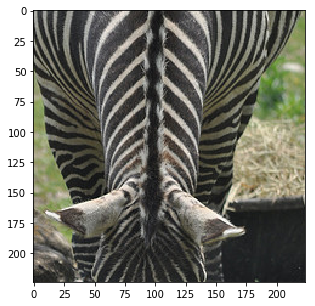

Probability 100.00% of [zebra]
Probability 0.00% of [dog]
Probability 0.00% of [horse]
Probability 0.00% of [giraffe]
Probability 0.00% of [bear]


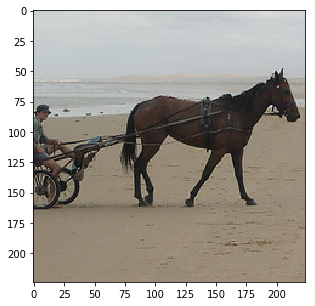

Probability 96.11% of [horse]
Probability 1.85% of [cat]
Probability 0.77% of [bird]
Probability 0.43% of [giraffe]
Probability 0.40% of [sheep]


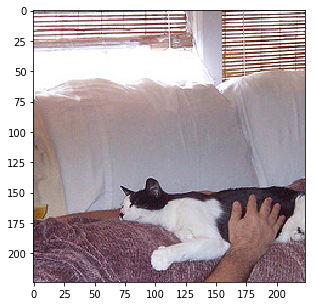

Probability 99.75% of [dog]
Probability 0.22% of [cat]
Probability 0.03% of [horse]
Probability 0.00% of [bear]
Probability 0.00% of [zebra]


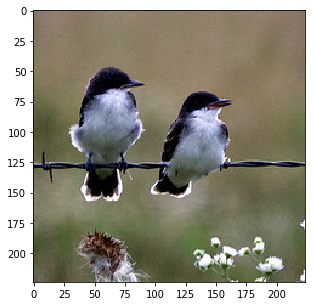

Probability 99.88% of [bird]
Probability 0.11% of [horse]
Probability 0.00% of [giraffe]
Probability 0.00% of [bear]
Probability 0.00% of [cat]


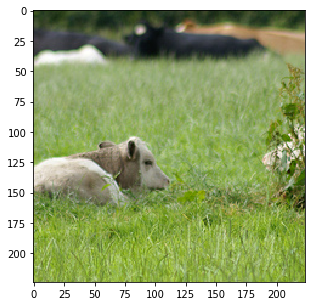

Probability 65.28% of [bear]
Probability 27.09% of [sheep]
Probability 4.34% of [bird]
Probability 1.71% of [giraffe]
Probability 0.63% of [dog]


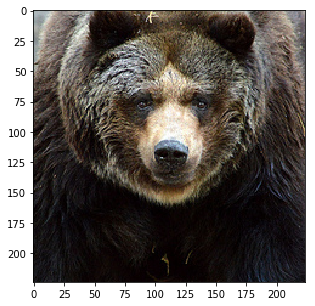

Probability 100.00% of [bear]
Probability 0.00% of [sheep]
Probability 0.00% of [dog]
Probability 0.00% of [cat]
Probability 0.00% of [giraffe]


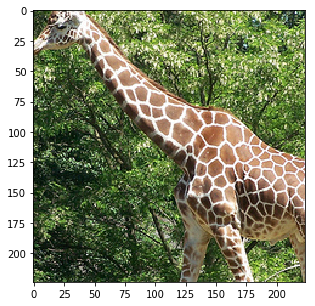

Probability 100.00% of [giraffe]
Probability 0.00% of [bird]
Probability 0.00% of [bear]
Probability 0.00% of [sheep]
Probability 0.00% of [zebra]


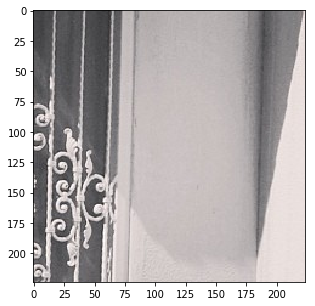

Probability 81.05% of [cat]
Probability 15.68% of [dog]
Probability 1.64% of [bird]
Probability 0.90% of [horse]
Probability 0.43% of [bear]


In [20]:
disp(images_test,id2label=coco.id2label,probs=probs,scale=True)